In [1]:
import pandas as pd
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import re
import textwrap
from dna_features_viewer import GraphicFeature, GraphicRecord
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import matplotlib.text as mtext

In [2]:
def assign_hhblits_hit(hit_name):
    if '~' in hit_name:
        return 'defense'
    elif 'PF' == hit_name[:2]:
        return 'pfam'
    elif '|' in hit_name:
        return 'innate'
    else:
        return 'pdb'

In [3]:
def select_domains(hhblits_df, prob_cutoff=50):
    out_list = []
    for group, group_df in hhblits_df[(hhblits_df['Prob'] > prob_cutoff)].groupby('query'):
        group_df = group_df.sort_values('Prob', ascending=False)
        while len(group_df):
            selected_row = group_df.head(1).squeeze()
            out_list.append(selected_row)
            group_df = group_df[(group_df['qend'] < selected_row['qstart']) |
                                (group_df['qstart'] > selected_row['qend'])]
    selected_domain_df = pd.concat(out_list, axis=1).T
    selected_domain_df['wrapped_name'] = [textwrap.fill(text, width=60) for text in selected_domain_df['hit_name']]
    selected_domain_df['display_name'] = selected_domain_df['wrapped_name'] + ' (Pr=' + selected_domain_df['Prob'].astype(str) + ')'
    selected_domain_df['display_start'] = (selected_domain_df['qstart'] - 1)*3
    selected_domain_df['display_end'] = (selected_domain_df['qend'] - 1)*3
    return selected_domain_df

In [4]:
def plot_neighborhood(full_neighborhood_df, feature_color_mapping=None, 
                      cmap=None, ax=None):
    if ax is None:
        ax = plt.gca()
    if cmap is None:
        cmap = matplotlib.colormaps.get_cmap('viridis')
    if feature_color_mapping is None:
        feature_color_mapping = {'CDS': '#e69f00',
                                 'pseudo': '#ffdc8f',
                                 'tRNA': '#56b4e9',
                                 'tmRNA': '#56b4e9',
                                 'riboswitch': '#56b4e9',
                                 'sequence_feature': '#56b4e9'}
    max_loc = full_neighborhood_df['end'].max()
    min_loc = full_neighborhood_df['start'].min()
    feature_len = max_loc - min_loc
    features = []
    for _, row in full_neighborhood_df.iterrows():
        if not pd.isna(row['attributes']) and ('pseudo' in row['attributes']):
            color='darkgrey'
        elif not pd.isna(row['beaker_prediction']):
            color = cmap(row['beaker_prediction'])
        else:
            color='white'
        if (row['name'] == 'hypothetical protein') or \
                (row['name'] == ''):
            label = None
        else:
            label = row['name']
        if not pd.isna(row['center_operon']) and row['center_operon']:
            linewidth = 3
        else:
            linewidth = 1
        linecolor = 'black'
        if row['defense_homolog']:
            linecolor = 'grey'                
        if row['strand'] == '+':
            strand = 1
        else:
            strand = -1
        start = row['start'] - min_loc
        end = row['end'] - min_loc
        ft = GraphicFeature(start=start, end=end, strand=strand,
                            color=color, label=label, linewidth=linewidth, 
                            linecolor=linecolor)
        features.append(ft)
    record = GraphicRecord(features = features, sequence_length=feature_len)
    record.plot(ax=ax)
    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plt.colorbar(sm, label='Beaker p(defense)', ax=ax, location='top', shrink=0.5)

In [5]:
def plot_domains(domain_df, min_loc, ax, name, start_col, end_col, display_col,
                 palette=sns.color_palette("tab20")):
    if name == 'tm':
        palette = {'outside': '#a6cee3',
                   'TMhelix': '#1f78b4',
                   'signal': '#b2df8a'}
    domain_df['dom_genome_start'] = domain_df[start_col] + domain_df['start']
    domain_df['dom_genome_end'] = domain_df[end_col] + domain_df['start']
    domain_df['dom_plot_start'] = domain_df['dom_genome_start'] - min_loc
    domain_df['dom_plot_end'] = domain_df['dom_genome_end'] - min_loc
    domain_df['dom_len'] = domain_df[end_col] - domain_df[start_col]
    domain_df = (domain_df.sort_values('dom_plot_start', ascending=True)
                 .reset_index(drop=True))
    domain_rectangles = []
    for i, (_, row) in enumerate(domain_df.iterrows()):
        label = row[display_col]
        if name == 'tm':
            c = palette[label]
        else:
            c = palette[i % len(palette)]
        rect = Rectangle((row['dom_plot_start'], 0), row['dom_len'], 1, 
                         color=c, label=label)
        ax.add_patch(rect)
    ax.set_yticks([0.5])
    ax.set_yticklabels([name])
    handles, labels = ax.get_legend_handles_labels()
    handles = [name] + handles
    labels = [''] + labels
    sns.despine()
    return handles, labels

In [6]:
class LegendTitle(object):
    def __init__(self, text_props=None):
        self.text_props = text_props or {}
        super(LegendTitle, self).__init__()

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        title = mtext.Text(x0, y0, orig_handle,  **self.text_props)
        handlebox.add_artist(title)
        return title


In [7]:
assemblies_dir = '../data/interim/ecor_assemblies/'
feature_files = [f for f in os.listdir(assemblies_dir) if '.txt' in f]
feature_file_list = list()
for f in tqdm(feature_files):
    feature_file_list.append(pd.read_table(assemblies_dir + f))
feature_df = pd.concat(feature_file_list)

100%|██████████| 69/69 [00:12<00:00,  5.47it/s]


In [8]:
blacklisted_domains = pd.read_csv('../data/interim/df_blacklisted_domains.csv')
prefilt_hhblits_df = pd.read_csv('../data/interim/pd_prefilt_pfam_innate_df_domains.csv')
minimal_pd_operon_df = pd.read_csv('../data/interim/ecor_minimal_pd_operons.csv')
ecor_predictions = pd.read_csv('../data/interim/ecor_predictions.csv')

/state/partition1/slurm_tmp/27536024.0.0/ipykernel_625374/4136734901.py:4: DtypeWarning: Columns (21,27) have mixed types. Specify dtype option on import or set low_memory=False.
  ecor_predictions = pd.read_csv('../data/interim/ecor_predictions.csv')


In [39]:
validated_df = pd.read_csv('../data/interim/hit_seq_info.csv')
validated_df['working_id'].nunique()

44

In [9]:
prefilt_hhblits_df['category'] = prefilt_hhblits_df['hit_name'].apply(assign_hhblits_hit)
filt_hhblits_df = prefilt_hhblits_df[prefilt_hhblits_df['query'].isin(minimal_pd_operon_df['query']) & 
                                     (prefilt_hhblits_df['category'] != 'defense') & 
                                     (~prefilt_hhblits_df['hit_name'].str.contains('DUF', case=True))].reset_index(drop=True)

## Select operons with novel domains or homology to eukaryotic innate immunity proteins

In [10]:
top_alignment_list = list()
for category, category_df in filt_hhblits_df.groupby('category'):
    top_alignment_df = select_domains(category_df)
    top_alignment_df['category'] = category
    top_alignment_list.append(top_alignment_df)
top_alignment_df = pd.concat(top_alignment_list)

In [12]:
novel_prob_cutoff = 85
filtered_top_alignment_df = top_alignment_df[~top_alignment_df['hit_name'].isin(blacklisted_domains['hit_name']) &
                                             ~top_alignment_df['hit_name'].str.contains('DUF') &
                                             (top_alignment_df['Prob'] > novel_prob_cutoff)]

### DUF analysis

In [54]:
filt_hhblits_df_duf = prefilt_hhblits_df[prefilt_hhblits_df['query'].isin(minimal_pd_operon_df['query']) & 
                                     (prefilt_hhblits_df['category'] != 'defense')].reset_index(drop=True)

In [55]:
top_alignment_list = list()
for category, category_df in filt_hhblits_df_duf.groupby('category'):
    top_alignment_df = select_domains(category_df)
    top_alignment_df['category'] = category
    top_alignment_list.append(top_alignment_df)
top_alignment_df_duf = pd.concat(top_alignment_list)

In [56]:
validated_queries = validated_df['product_accession'].str.split('.', expand=True)[0]

In [61]:
novel_prob_cutoff = 85
filtered_top_alignment_df_duf = top_alignment_df_duf[~top_alignment_df_duf['hit_name'].isin(blacklisted_domains['hit_name']) &
                                                     (top_alignment_df_duf['Prob'] > novel_prob_cutoff) & 
                                                     top_alignment_df_duf['query'].isin(validated_queries) &
                                                     top_alignment_df_duf['hit_name'].str.contains('DUF')]

In [62]:
filtered_top_alignment_df_duf

,Hit,Prob,E-value,P-value,Score,SS,Cols,Query HMM,Template HMM,query,qstart,qend,hit_name,category,wrapped_name,display_name,display_start,display_end
1266,PF11236.11 ; DUF3037 ; Protein,99.8,0.0,0.0,153.8,0.0,116.0,7-125,1-118 (118),WP_000210934,7.0,125.0,PF11236.11 ; DUF3037 ; Protein of unknown func...,pfam,PF11236.11 ; DUF3037 ; Protein of unknown func...,PF11236.11 ; DUF3037 ; Protein of unknown func...,18.0,372.0
2317,PF06852.15 ; DUF1248 ; Protein,90.0,0.0063,0.000002,42.6,0.0,66.0,264-330,56-132 (180),WP_000354965,264.0,330.0,PF06852.15 ; DUF1248 ; Protein of unknown func...,pfam,PF06852.15 ; DUF1248 ; Protein of unknown func...,PF06852.15 ; DUF1248 ; Protein of unknown func...,789.0,987.0
7158,PF12358.11 ; DUF3644 ; Protein,96.2,0.000012,0.0,52.0,0.0,64.0,49-127,2-66 (66),WP_001313577,49.0,127.0,PF12358.11 ; DUF3644 ; Protein of unknown func...,pfam,PF12358.11 ; DUF3644 ; Protein of unknown func...,PF12358.11 ; DUF3644 ; Protein of unknown func...,144.0,378.0
17049,PF10934.11 ; DUF2634 ; Protein,98.9,0.0,0.0,105.1,0.0,96.0,234-346,7-103 (104),WP_225403053,234.0,346.0,PF10934.11 ; DUF2634 ; Protein of unknown func...,pfam,PF10934.11 ; DUF2634 ; Protein of unknown func...,PF10934.11 ; DUF2634 ; Protein of unknown func...,699.0,1035.0


In [52]:
blacklisted_pfam_names = blacklisted_domains.loc[blacklisted_domains['hit_name'].str.startswith('PF'), 'hit_name'].str.split(' ; ', expand=True)[1].to_list()

In [53]:
validated_dufs = ['3037', '1829', '5830', '61', '6614', '6988', '6650', '6680', '2971']
for duf in validated_dufs:
    if 'DUF' + duf not in blacklisted_pfam_names:
        print(duf)

3037
1829
5830
61
6614
6988
6650


### End DUF analysis

In [26]:
filt_hhblits_df_duf

,Hit,Prob,E-value,P-value,Score,SS,Cols,Query HMM,Template HMM,query,qstart,qend,hit_name,category
0,PF19557.2 ; DUF6079 ; Family o,60.8,3.500000e-01,8.200000e-05,55.6,0.0,49.0,23-80,28-76 (1199),WP_000007259,23.0,80.0,PF19557.2 ; DUF6079 ; Family of unknown functi...,pfam
1,PF05673.16 ; DUF815 ; Protein,57.8,4.000000e-01,1.000000e-04,42.4,0.0,61.0,21-83,17-79 (252),WP_000007259,21.0,83.0,PF05673.16 ; DUF815 ; Protein of unknown funct...,pfam
2,PF10649.12 ; DUF2478 ; Protein,43.9,9.500000e-01,2.400000e-04,37.2,0.0,25.0,60-84,1-25 (159),WP_000007259,60.0,84.0,PF10649.12 ; DUF2478 ; Protein of unknown func...,pfam
3,PF07077.14 ; DUF1345 ; Protein,96.5,4.400000e-06,7.800000e-10,63.7,0.0,49.0,308-362,125-173 (174),WP_000013736,308.0,362.0,PF07077.14 ; DUF1345 ; Protein of unknown func...,pfam
4,PF19779.2 ; DUF6264 ; Family o,46.9,1.100000e+00,2.000000e-04,31.4,0.0,8.0,365-372,132-139 (173),WP_000013736,365.0,372.0,PF19779.2 ; DUF6264 ; Family of unknown functi...,pfam
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2400,PF14294.9 ; DUF4372 ; Domain o,6.0,2.400000e+01,6.300000e-03,17.9,0.0,38.0,58-95,5-42 (74),WP_250112094,58.0,95.0,PF14294.9 ; DUF4372 ; Domain of unknown functi...,pfam
2401,PF16263.8 ; DUF4917 ; Domain o,98.9,1.200000e-13,2.400000e-17,117.8,0.0,50.0,163-213,110-181 (311),WP_250112301,163.0,213.0,PF16263.8 ; DUF4917 ; Domain of unknown functi...,pfam
2402,PF18462.4 ; DUF5612 ; Domain o,10.1,1.800000e+01,3.100000e-03,23.8,0.0,18.0,7-24,9-26 (142),WP_250112301,7.0,24.0,PF18462.4 ; DUF5612 ; Domain of unknown functi...,pfam
2403,PF13875.9 ; DUF4202 ; Domain o,52.0,7.200000e-01,1.500000e-04,35.0,0.0,36.0,81-134,29-64 (184),WP_250112306,81.0,134.0,PF13875.9 ; DUF4202 ; Domain of unknown functi...,pfam


In [13]:
filtered_top_alignment_df.to_csv('../data/processed/ecor_novel_domains.csv', index=False)

In [24]:
filtered_top_alignment_df['category'].value_counts()

category
pfam      76
innate     5
Name: count, dtype: int64

In [25]:
sampled_operons = minimal_pd_operon_df.loc[minimal_pd_operon_df['query'].isin(filtered_top_alignment_df['query']), 
                                           'operon'].unique()
sampled_operon_df = minimal_pd_operon_df.loc[minimal_pd_operon_df['operon'].isin(sampled_operons)]
print('# selected operons', len(sampled_operons))
print('# cloned operons:', sampled_operon_df.loc[sampled_operon_df['cloned'], 'operon'].nunique())

# selected operons 70
# cloned operons: 8


In [26]:
sample_operon_max_prob = (sampled_operon_df.groupby('operon')
                      .agg(max_p_defense = ('beaker_prediction', 'max'))
                      .reset_index())

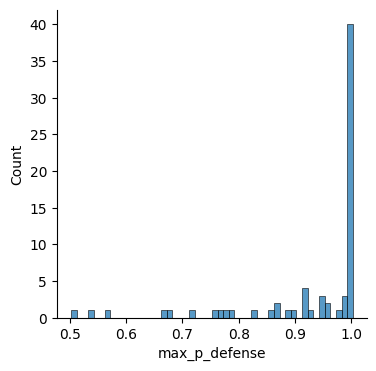

In [27]:
plt.subplots(figsize=(4,4))
sns.histplot(data=sample_operon_max_prob,
             x='max_p_defense', binwidth=0.01)
sns.despine()

## HHblits

In [17]:
sampled_operon_proteins = sampled_operon_df['product_accession'].drop_duplicates()
out_sampled_protein_accs = '../data/interim/ecor_novel_domain_proteins.txt'
sampled_operon_proteins.to_csv(out_sampled_protein_accs, index=False)
out_sampled_protein_faa = '../data/interim/ecor_novel_domain_proteins.faa'
os.system(' '.join(['conda run -n beaker', 
                    'seqtk subseq', 
                    '../data/interim/ecor_unique_seqs.faa', 
                    out_sampled_protein_accs, '>' , 
                    out_sampled_protein_faa]))

0

In [28]:
msa_dir = '../data/interim/ecor_novel_domain_protein_msas/'
filt_1_msa_dir = '../data/interim/pd_filt_1_msas/'


In [18]:
if 'ecor_novel_domain_protein_msas' not in os.listdir('../data/interim/'):
    os.mkdir(msa_dir)
pd_filt_1_msas = os.listdir(filt_1_msa_dir)
n_prebuilt = 0
for acc in sampled_operon_proteins:
    acc_f = acc + '.a3m'
    if acc_f in pd_filt_1_msas:
        os.system(' '.join(['cp', os.path.join(filt_1_msa_dir, acc_f), os.path.join(msa_dir, acc_f)]))
        n_prebuilt += 1
print(n_prebuilt, 'MSAs prebuilt of', len(sampled_operon_proteins), 'total')   

86 MSAs prebuilt of 124 total


In [29]:
hhblits_out_f = '../data/interim/ecor_novel_domain_hhblits_out.csv'
hhblits_ali_dir = '../data/interim/ecor_novel_domain_hhblits_db_alis/'

In [20]:
os.system(' '.join(['conda run -n hhpred python',
                    '~/Documents/hhpred/code/hhpred.py', 
                    hhblits_ali_dir, hhblits_out_f, 
                    '--dbs pfam innate df pdb', 
                    '--in_fasta', out_sampled_protein_faa, 
                    '--n_iter 2', 
                    '--alignment_dir', msa_dir, 
                    '--n_jobs 40', 
                    '--reuse_msas']))

Building multiple sequence alignments from fasta
Wirting out individual fasta files to ~/Documents/hhpred/data/temp/temp_fasta/
Transferring the Uniclust database to a the local filesystem
Wirting out MSAs from uniclust to ../data/interim/ecor_novel_domain_protein_msas/
Reusing MSAs
Generating multiple sequence alignments with 2 iterations of HHblits
Querying pfam, innate, df, pdb database(s)



100%|██████████| 124/124 [00:32<00:00,  3.86it/s]



0

In [30]:
hhblits_df = pd.read_csv(hhblits_out_f)
hhblits_df['category'] = hhblits_df['hit_name'].apply(assign_hhblits_hit)
hhblits_df['category'].value_counts()

category
pdb        13961
pfam        5328
defense     2427
innate      1737
Name: count, dtype: int64

## Visualize operons

### Transmembrane regions

In [19]:
tm_out_list = list()
columns = ['product_accession', 'display_name', 'start', 'end']
reading = False
for line in open('../data/external/ecor_novel_domains_TMRs.gff3'):
    if (line[0] == '#') or (line.strip() == '//'):
        continue
    elif 'inside' in line:
        continue
    else:
        split_line = line.strip().split('\t')
        out_dict = dict()
        for k, v in zip(columns, split_line):
            if k in ['start', 'end']:
                v = int(v)
            out_dict[k] = v
        tm_out_list.append(out_dict)
tm_out_df = pd.DataFrame(tm_out_list) 
tm_out_df['display_start'] = (tm_out_df['start'] - 1)*3 
tm_out_df['display_end'] = (tm_out_df['end'] - 1)*3
tm_out_df = tm_out_df[tm_out_df['display_name'] != 'inside']

### Top Alignment

In [20]:
top_alignment_dict = dict()
for category, category_df in hhblits_df.groupby('category'):
    top_alignment_dict[category] = select_domains(category_df)

### Plot

In [21]:
sorted_predictions = (ecor_predictions.sort_values(['genomic_accession', 'start'])
                      .reset_index(drop=True))
sorted_predictions['query'] = sorted_predictions['product_accession'].str.split('.', expand=True)[0]

In [23]:
analyzed_operons = [x.split('.png')[0] for x in os.listdir('../figures/novel_domain_operons/') if '.png' in x]
analyzed_operons = [] ## TODO: remove

In [24]:
domain_palette_mapping = {'defense': sns.color_palette('Set2'), 
                          'pfam': sns.color_palette('Pastel1'), 
                          'innate': sns.color_palette('tab10'), 
                          'pdb': sns.color_palette('Paired')}

In [25]:
if 'novel_domain_operons' not in os.listdir('../figures/'):
    os.mkdir('../figures/novel_domain_operons/')

In [26]:
subsampled_operons = [x for x in sampled_operons if x not in analyzed_operons]

In [31]:
plt.rcParams['svg.fonttype'] = 'none'

  0%|          | 0/70 [00:00<?, ?it/s]

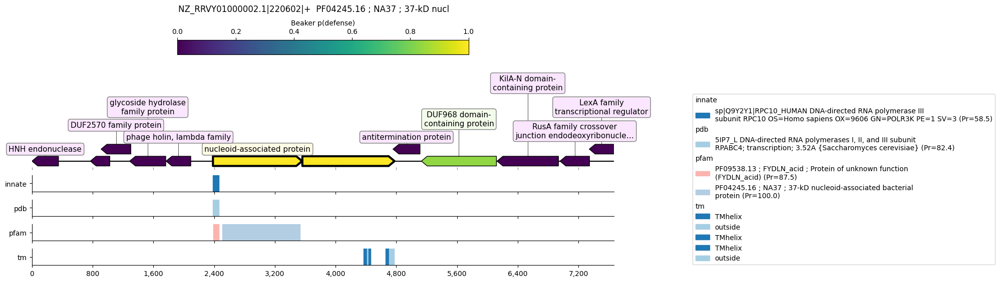

  1%|▏         | 1/70 [00:02<02:28,  2.15s/it]

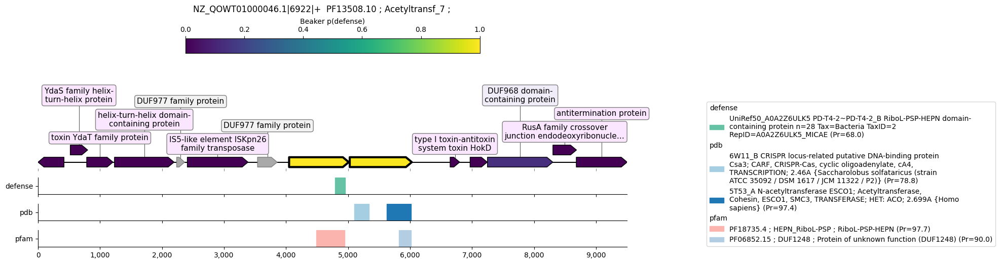

  3%|▎         | 2/70 [00:03<02:09,  1.91s/it]

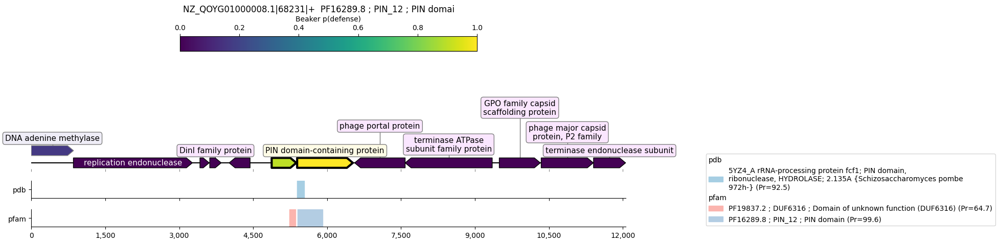

  4%|▍         | 3/70 [00:05<01:48,  1.61s/it]

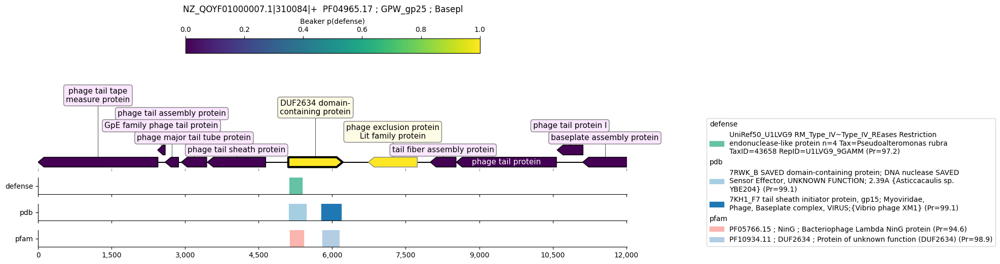

  6%|▌         | 4/70 [00:06<01:45,  1.60s/it]

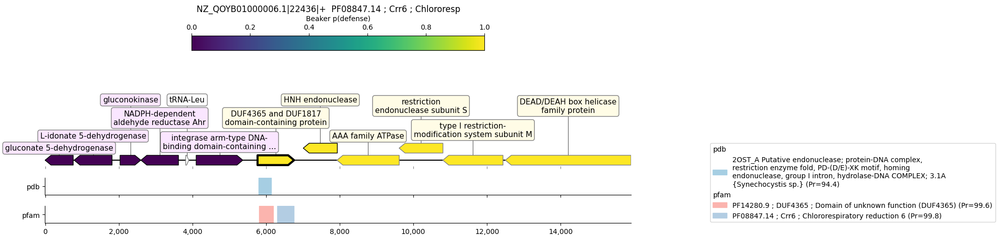

  7%|▋         | 5/70 [00:08<01:41,  1.56s/it]

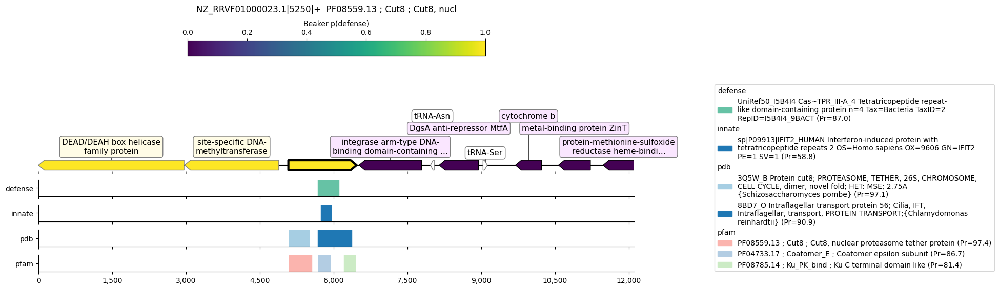

  9%|▊         | 6/70 [00:10<01:45,  1.64s/it]

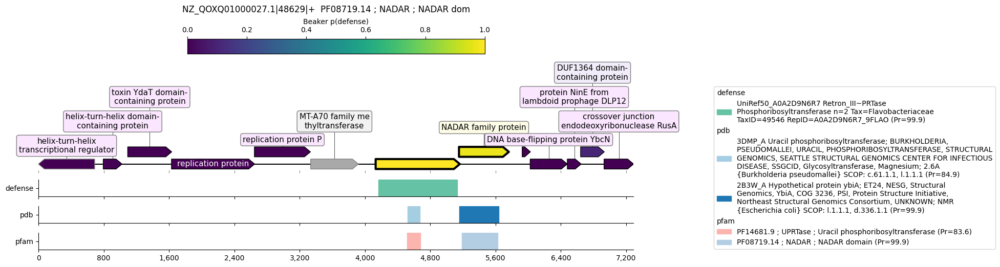

 10%|█         | 7/70 [00:11<01:45,  1.68s/it]

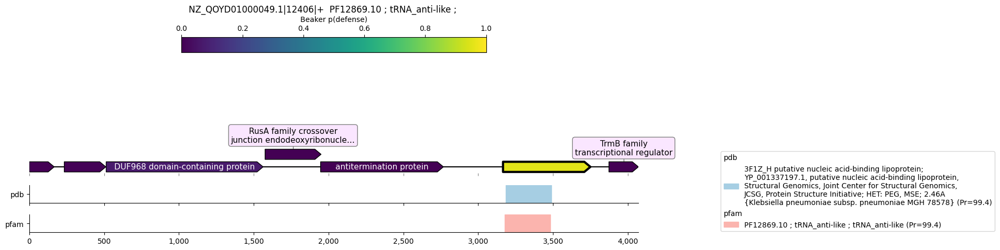

 11%|█▏        | 8/70 [00:12<01:33,  1.51s/it]

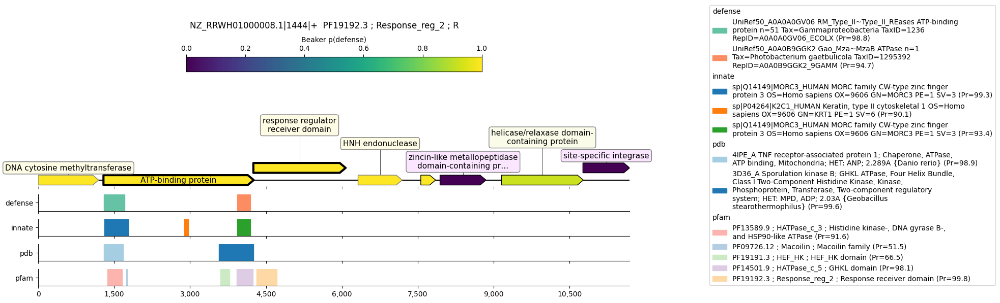

 13%|█▎        | 9/70 [00:15<01:44,  1.72s/it]

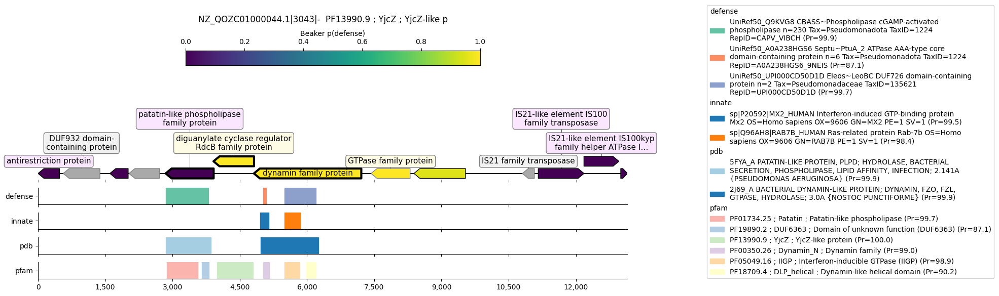

 14%|█▍        | 10/70 [00:17<01:51,  1.85s/it]

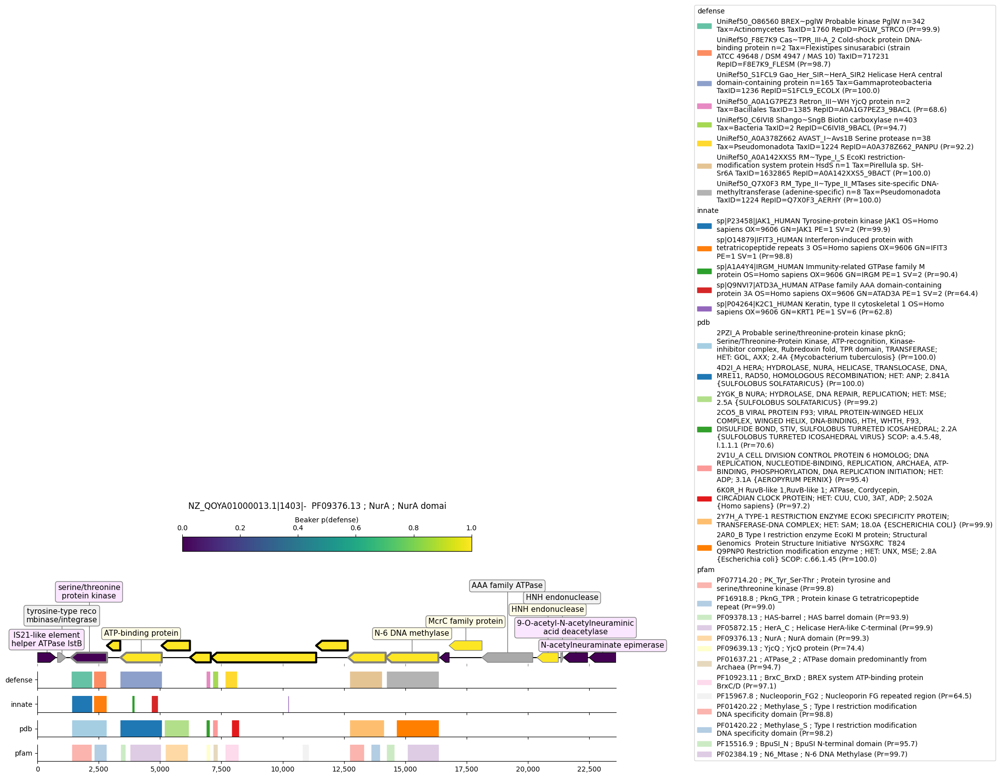

 16%|█▌        | 11/70 [00:21<02:25,  2.47s/it]

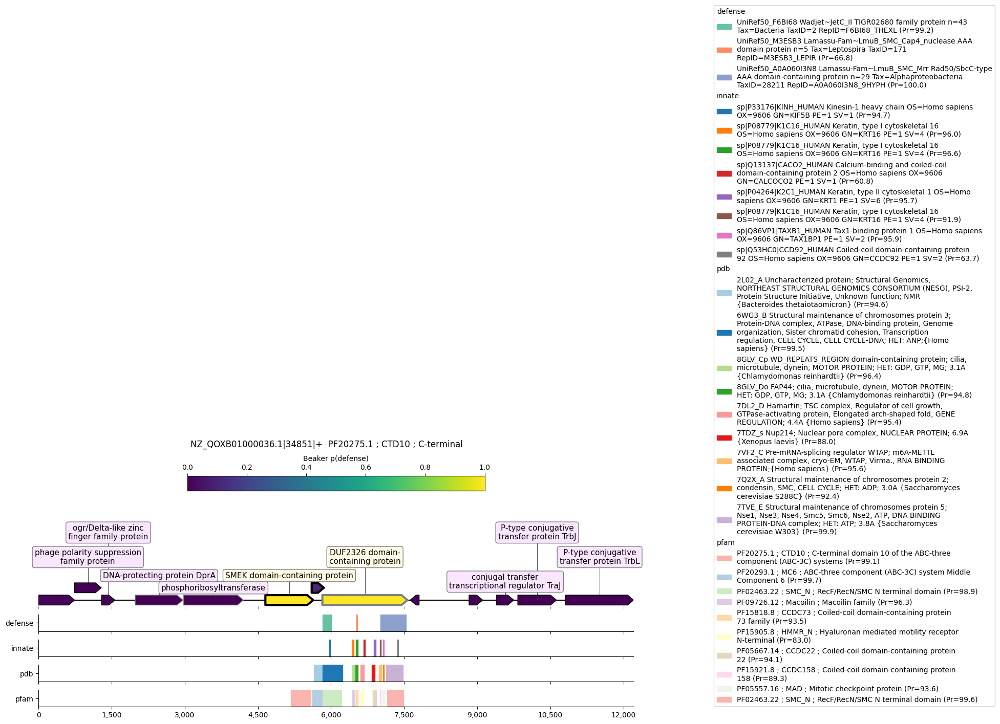

 17%|█▋        | 12/70 [00:24<02:43,  2.82s/it]

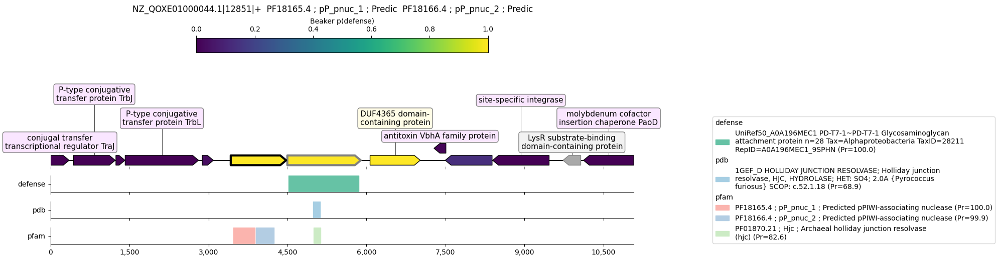

 19%|█▊        | 13/70 [00:26<02:19,  2.44s/it]

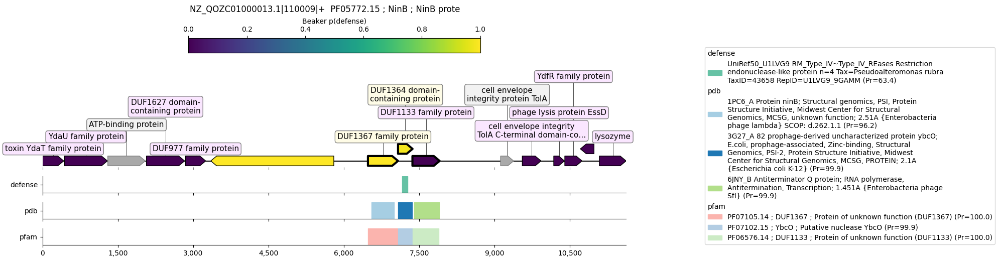

 20%|██        | 14/70 [00:28<02:05,  2.25s/it]

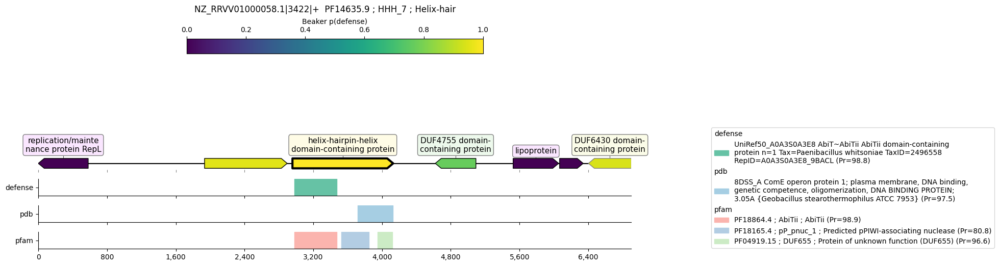

 21%|██▏       | 15/70 [00:29<01:50,  2.01s/it]

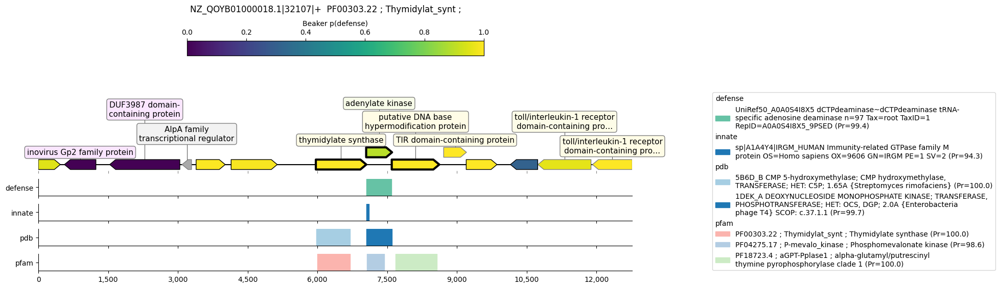

 23%|██▎       | 16/70 [00:31<01:48,  2.00s/it]

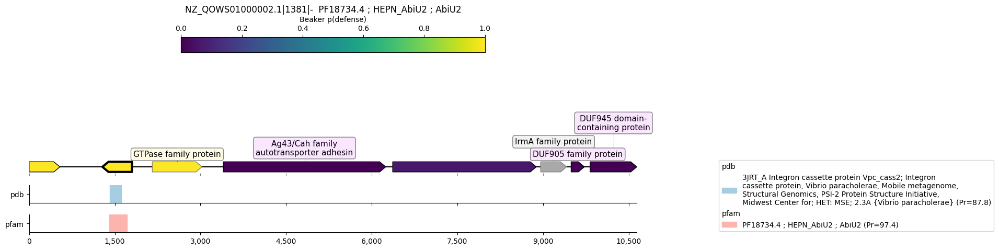

 24%|██▍       | 17/70 [00:32<01:32,  1.74s/it]

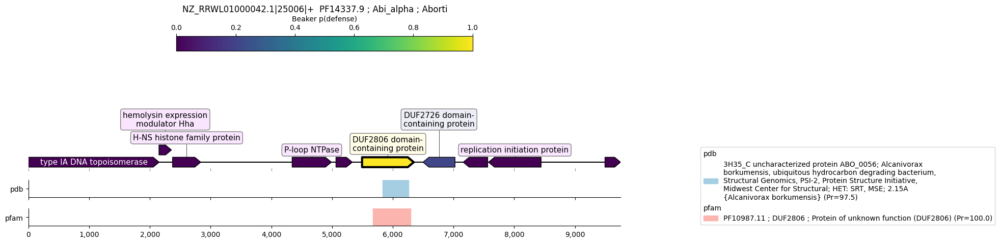

 26%|██▌       | 18/70 [00:33<01:23,  1.60s/it]

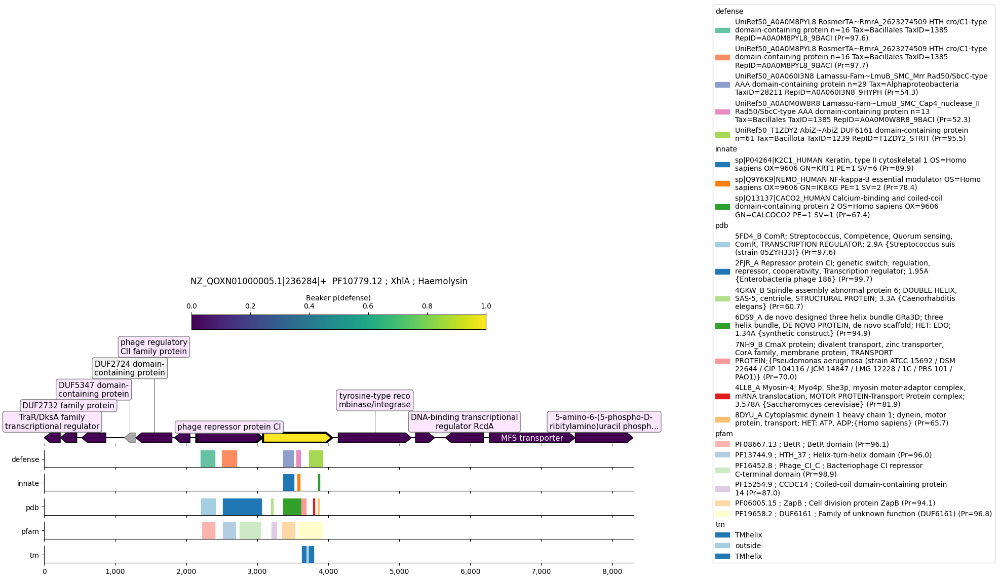

 27%|██▋       | 19/70 [00:37<01:44,  2.06s/it]

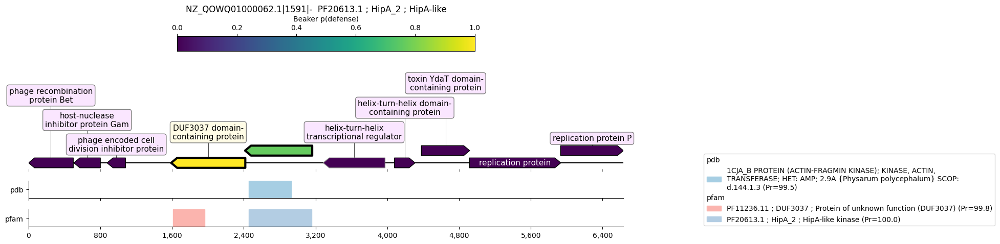

 29%|██▊       | 20/70 [00:38<01:31,  1.83s/it]

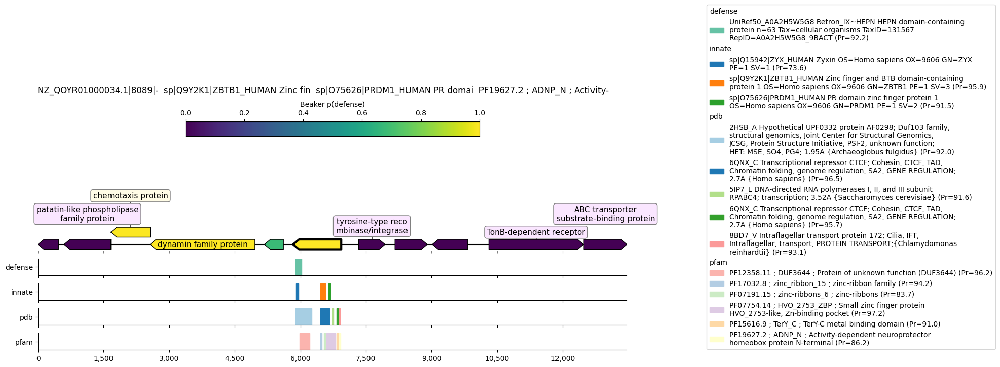

 30%|███       | 21/70 [00:40<01:38,  2.01s/it]

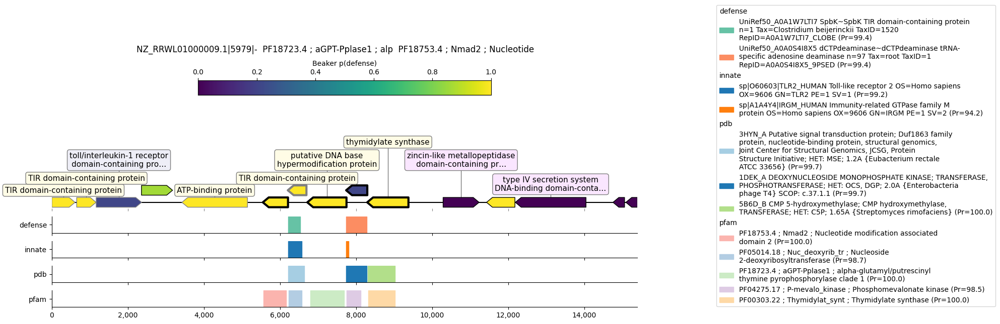

 31%|███▏      | 22/70 [00:43<01:39,  2.07s/it]

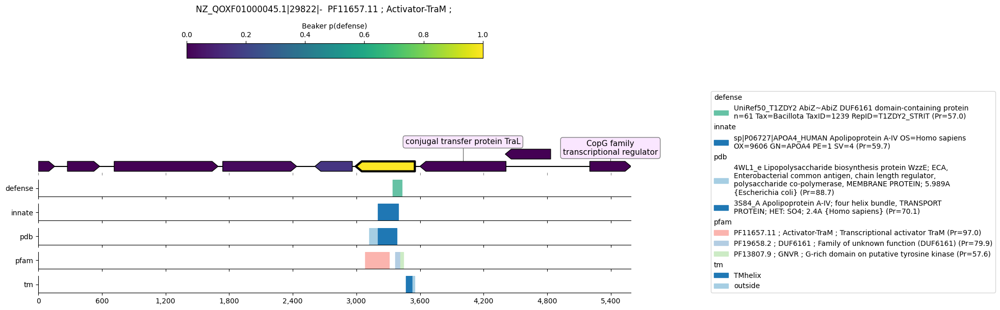

 33%|███▎      | 23/70 [00:44<01:33,  2.00s/it]

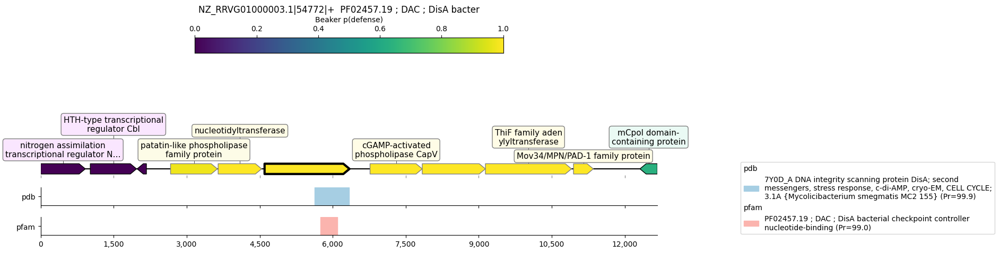

 34%|███▍      | 24/70 [00:46<01:23,  1.82s/it]

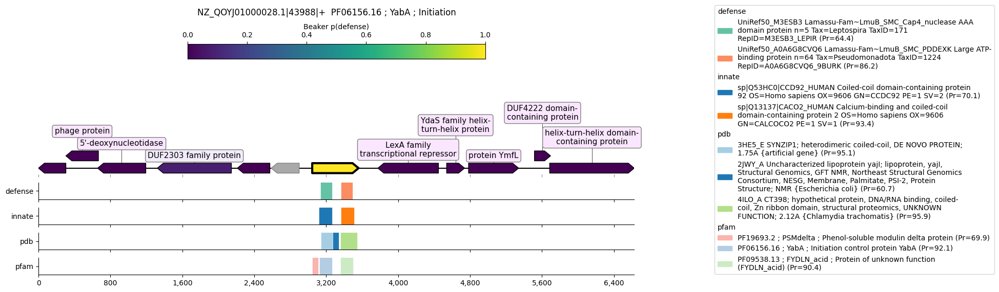

 36%|███▌      | 25/70 [00:48<01:24,  1.88s/it]

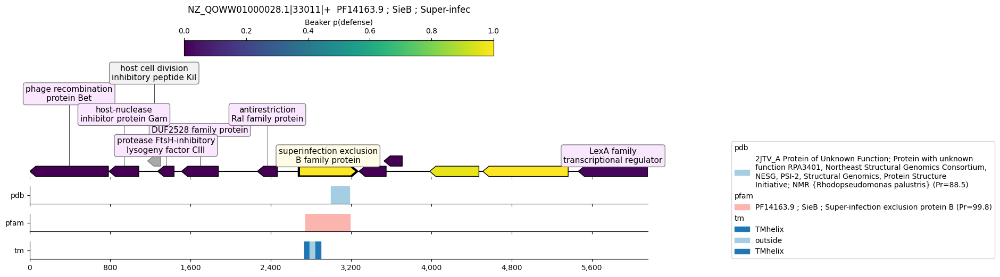

 37%|███▋      | 26/70 [00:49<01:17,  1.75s/it]

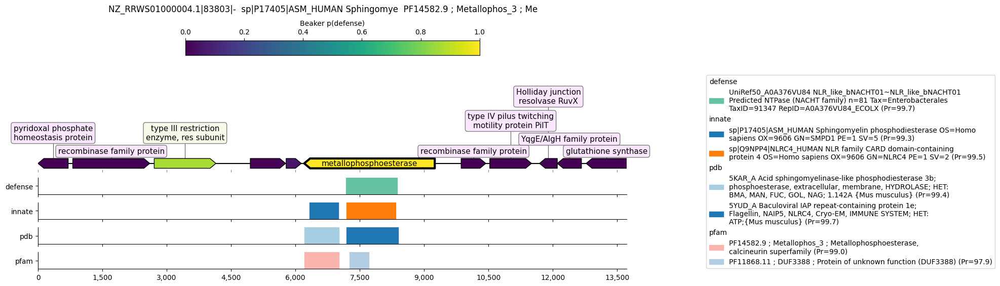

 39%|███▊      | 27/70 [00:51<01:17,  1.79s/it]

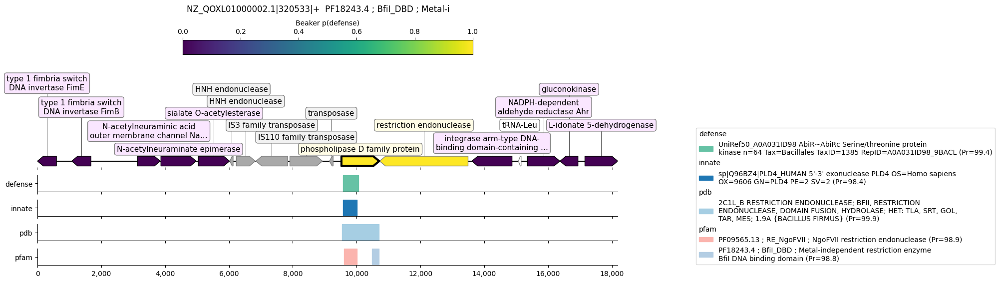

 40%|████      | 28/70 [00:53<01:18,  1.86s/it]

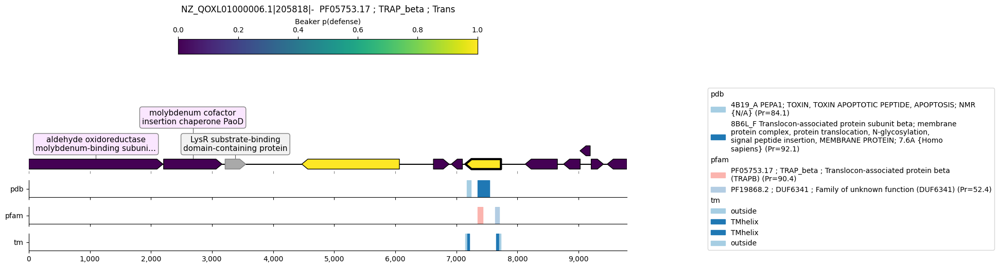

 41%|████▏     | 29/70 [00:55<01:11,  1.75s/it]

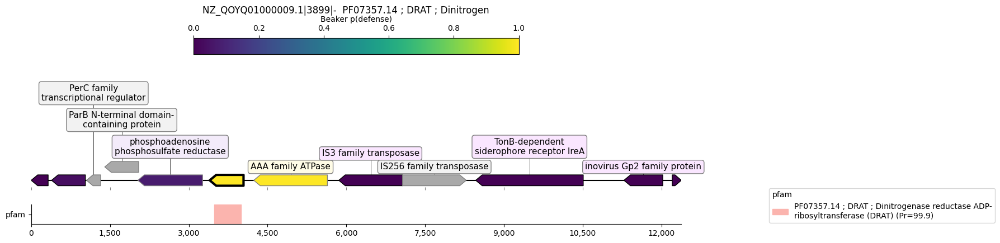

 43%|████▎     | 30/70 [00:56<01:02,  1.56s/it]

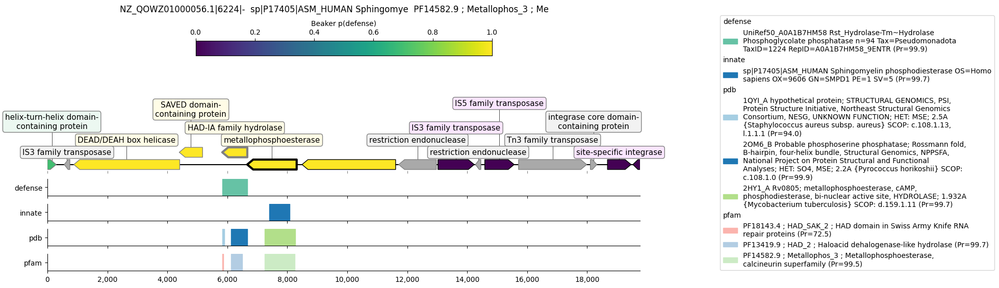

 44%|████▍     | 31/70 [00:58<01:06,  1.72s/it]

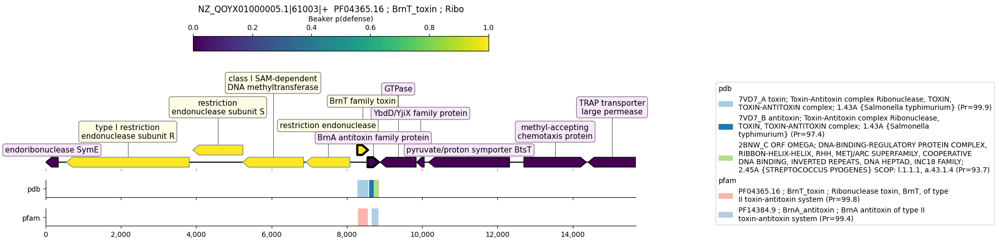

 46%|████▌     | 32/70 [00:59<01:03,  1.66s/it]

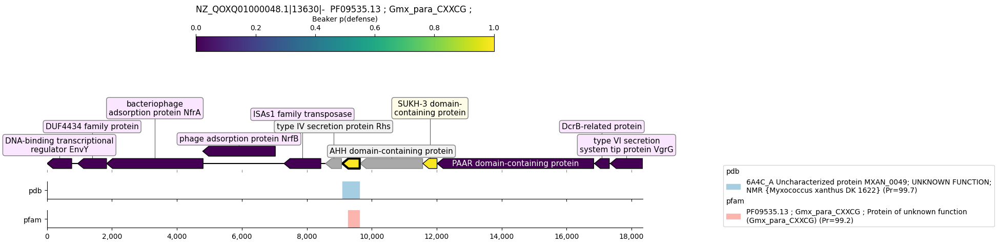

 47%|████▋     | 33/70 [01:01<00:58,  1.59s/it]

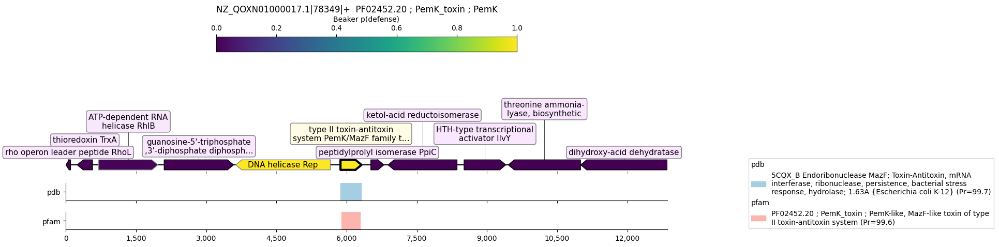

 49%|████▊     | 34/70 [01:02<00:54,  1.51s/it]

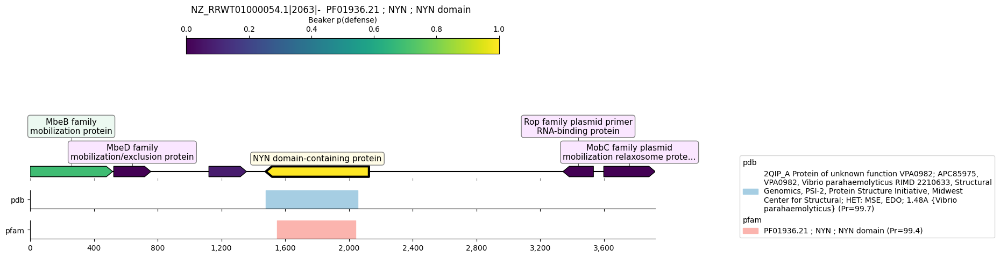

 50%|█████     | 35/70 [01:03<00:49,  1.42s/it]

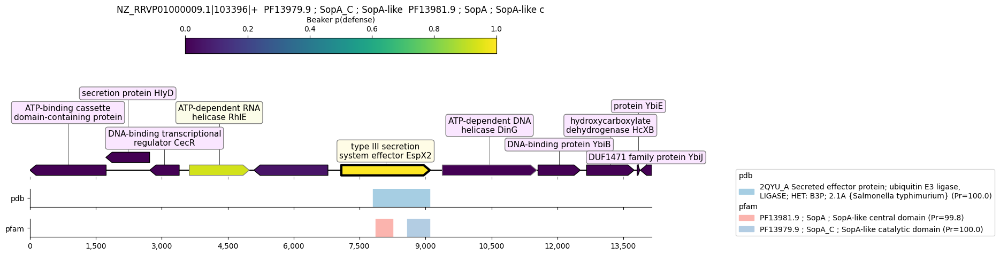

 51%|█████▏    | 36/70 [01:05<00:47,  1.39s/it]

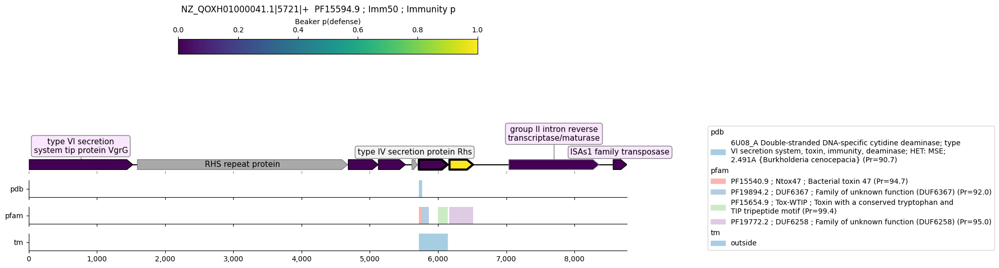

 53%|█████▎    | 37/70 [01:06<00:46,  1.40s/it]

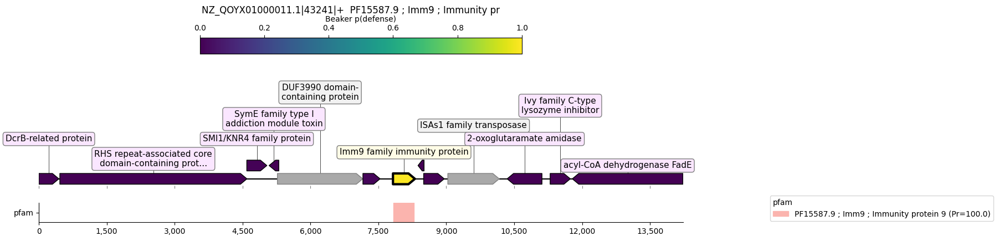

 54%|█████▍    | 38/70 [01:07<00:43,  1.37s/it]

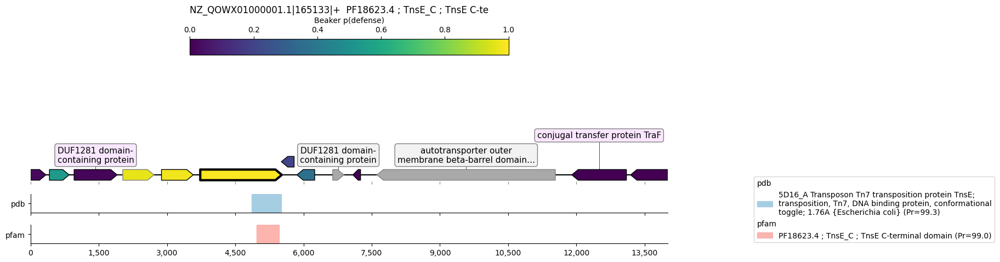

 56%|█████▌    | 39/70 [01:08<00:40,  1.30s/it]

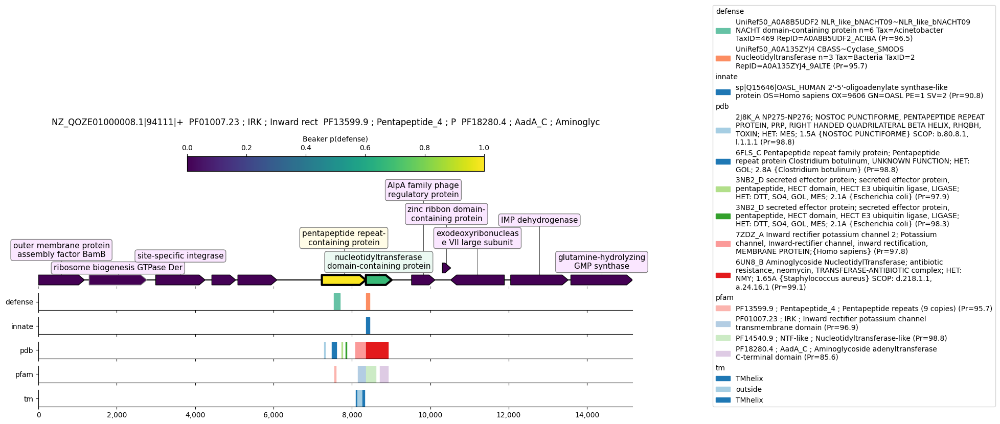

 57%|█████▋    | 40/70 [01:11<00:50,  1.69s/it]

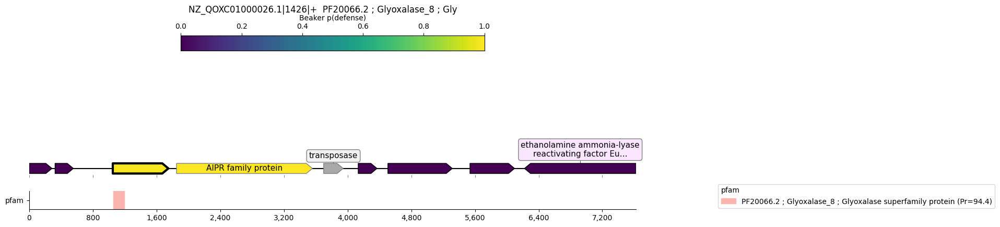

 59%|█████▊    | 41/70 [01:12<00:42,  1.47s/it]

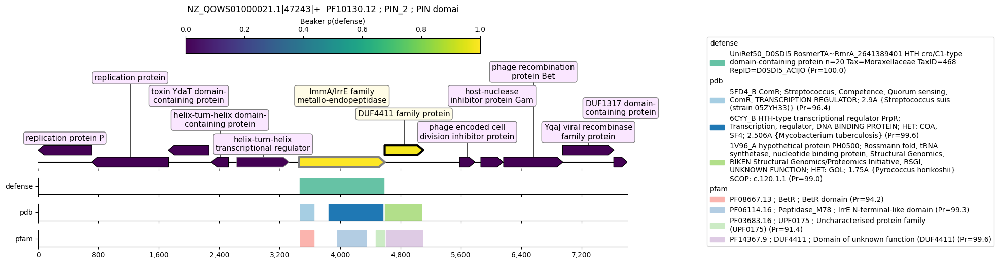

 60%|██████    | 42/70 [01:14<00:44,  1.60s/it]

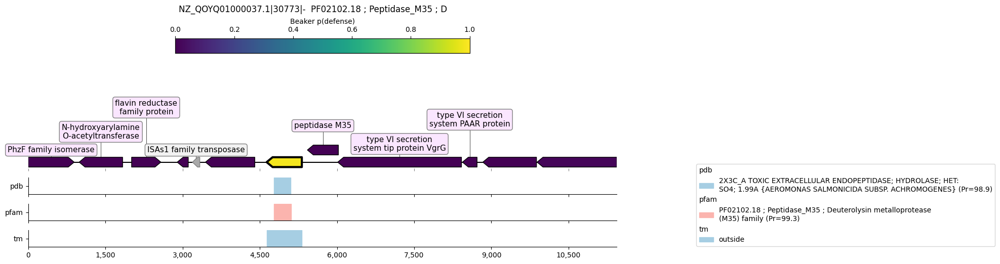

 61%|██████▏   | 43/70 [01:15<00:42,  1.56s/it]

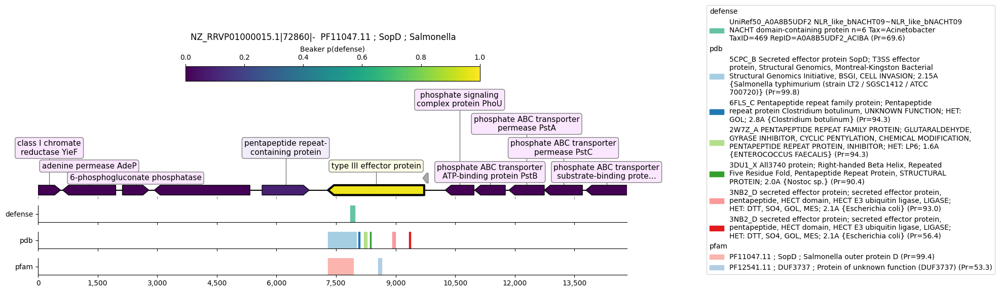

 63%|██████▎   | 44/70 [01:17<00:44,  1.70s/it]

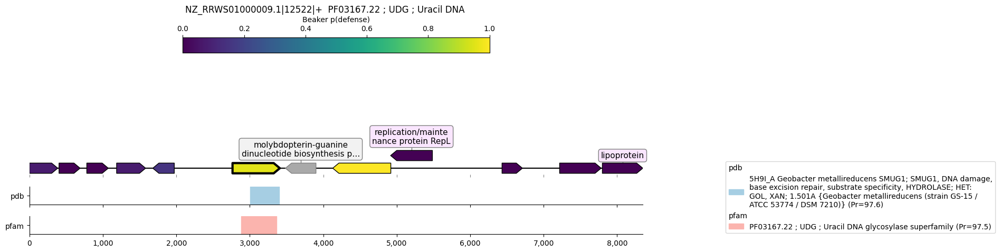

 64%|██████▍   | 45/70 [01:19<00:38,  1.54s/it]

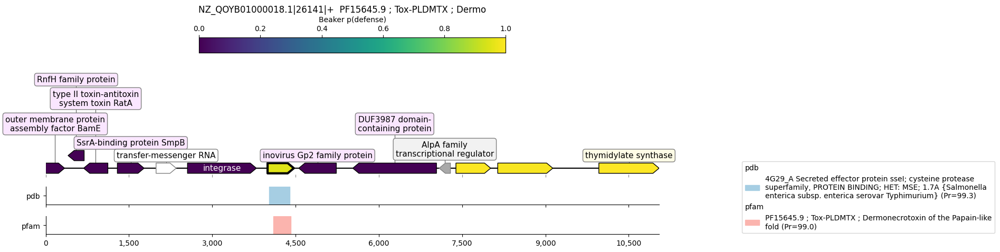

 66%|██████▌   | 46/70 [01:20<00:34,  1.45s/it]

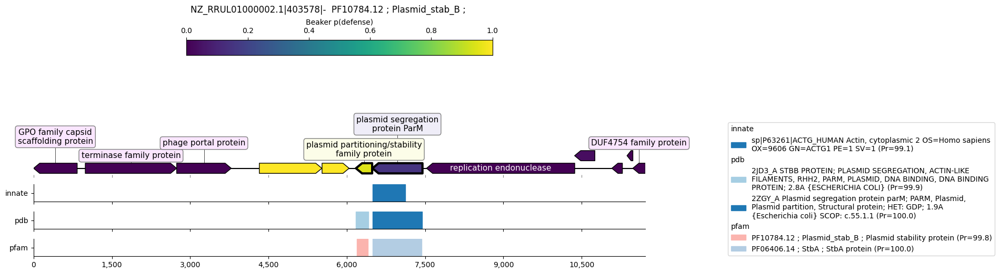

 67%|██████▋   | 47/70 [01:21<00:33,  1.46s/it]

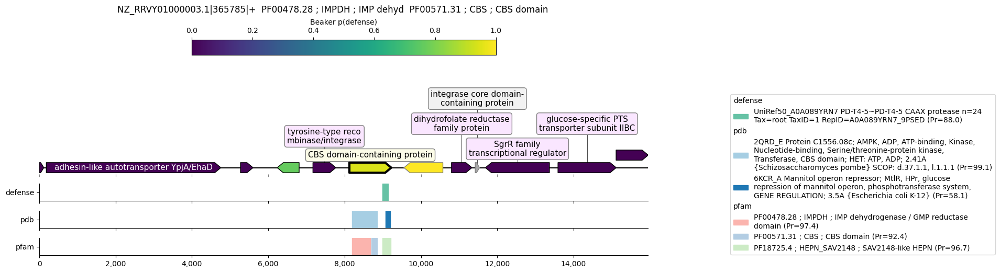

 69%|██████▊   | 48/70 [01:23<00:33,  1.54s/it]

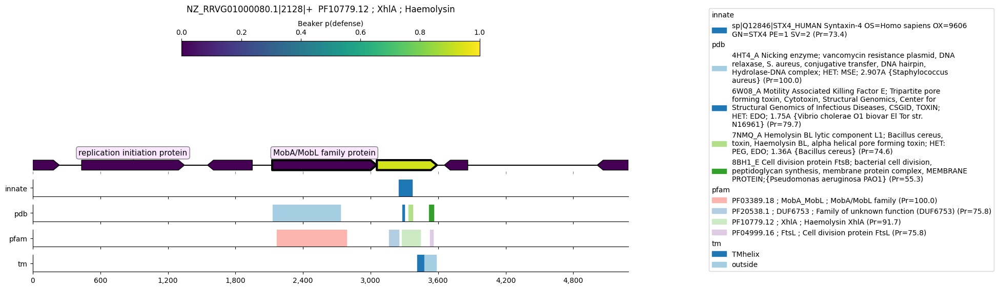

 70%|███████   | 49/70 [01:25<00:34,  1.63s/it]

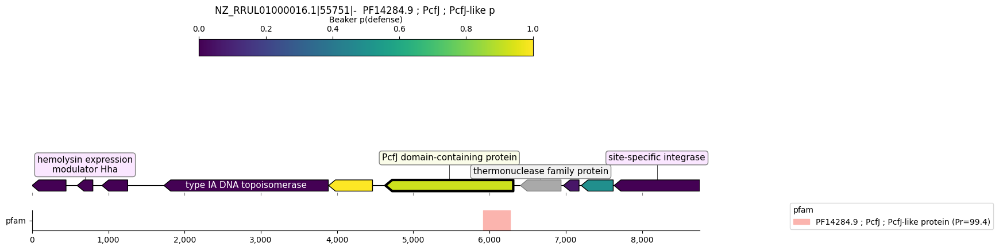

 71%|███████▏  | 50/70 [01:26<00:28,  1.44s/it]

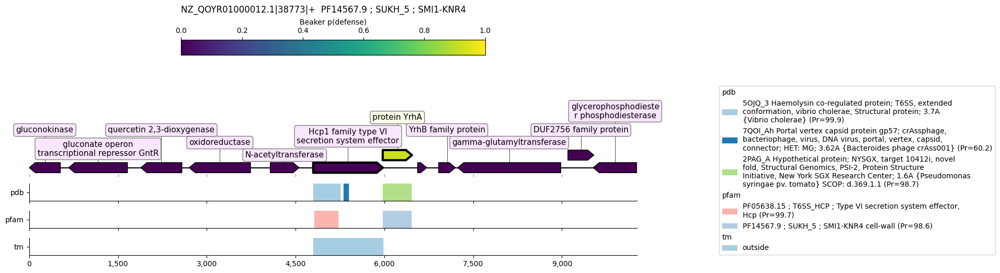

 73%|███████▎  | 51/70 [01:28<00:28,  1.49s/it]

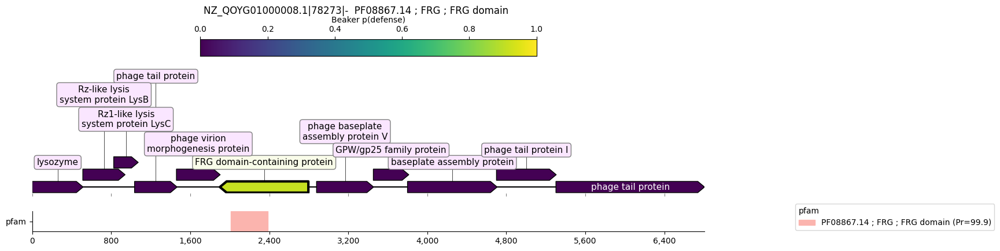

 74%|███████▍  | 52/70 [01:29<00:24,  1.37s/it]

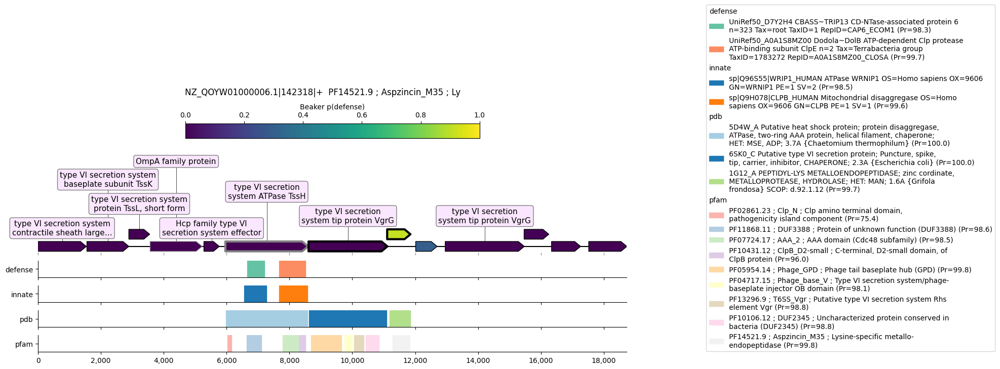

 76%|███████▌  | 53/70 [01:31<00:29,  1.71s/it]

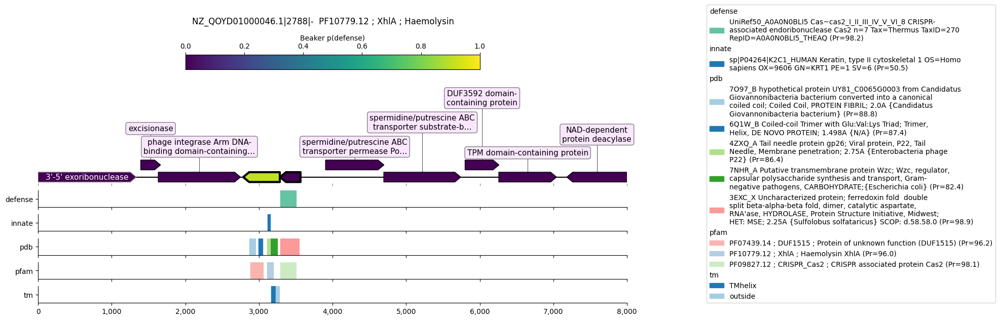

 77%|███████▋  | 54/70 [01:33<00:30,  1.88s/it]

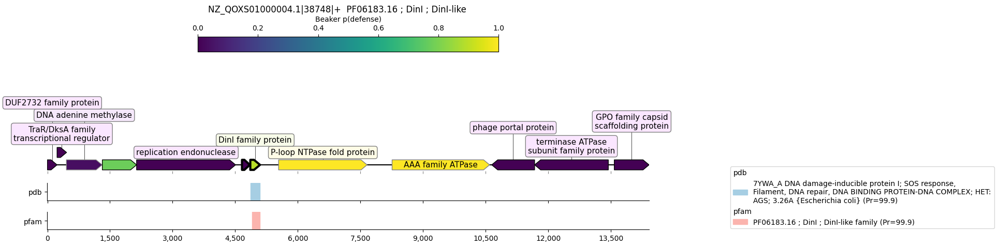

 79%|███████▊  | 55/70 [01:35<00:25,  1.69s/it]

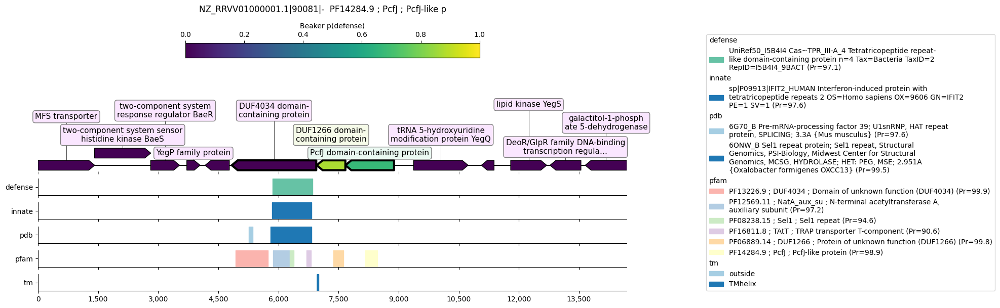

 80%|████████  | 56/70 [01:37<00:26,  1.89s/it]

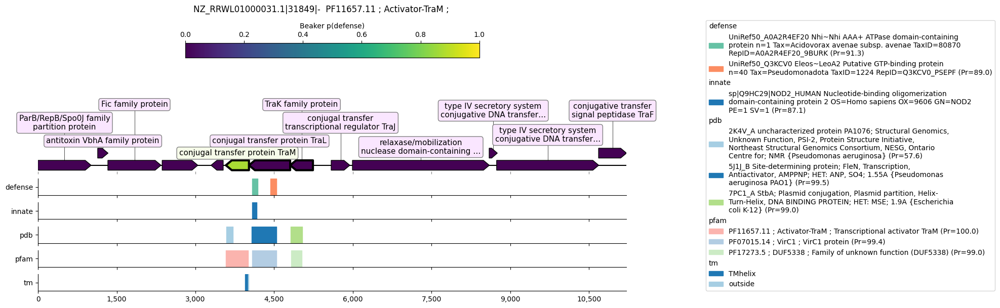

 81%|████████▏ | 57/70 [01:39<00:25,  1.99s/it]

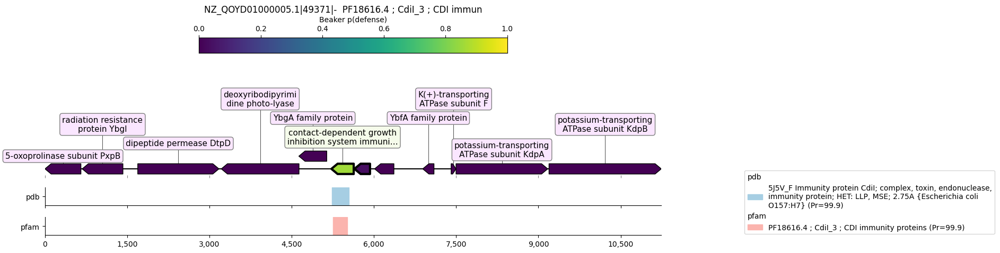

 83%|████████▎ | 58/70 [01:40<00:21,  1.77s/it]

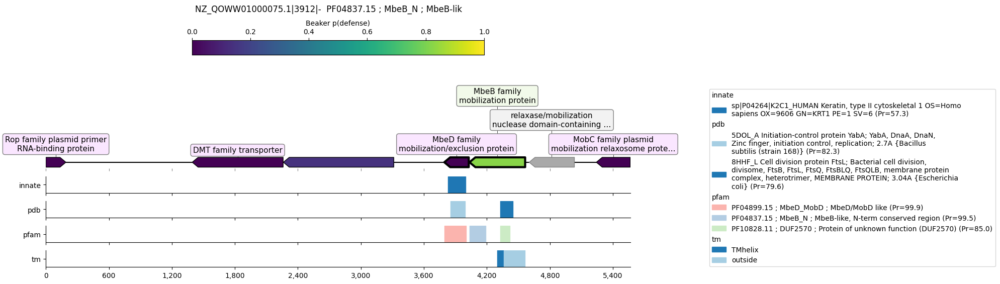

 84%|████████▍ | 59/70 [01:42<00:19,  1.77s/it]

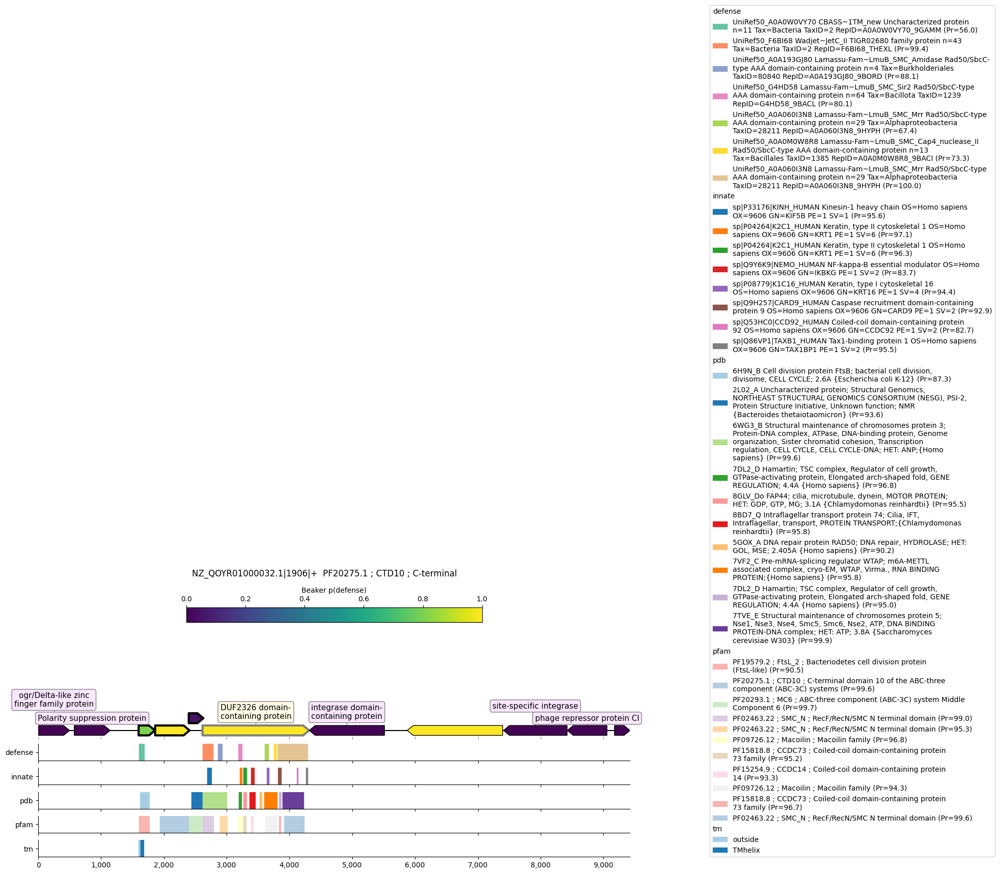

 86%|████████▌ | 60/70 [01:46<00:24,  2.48s/it]

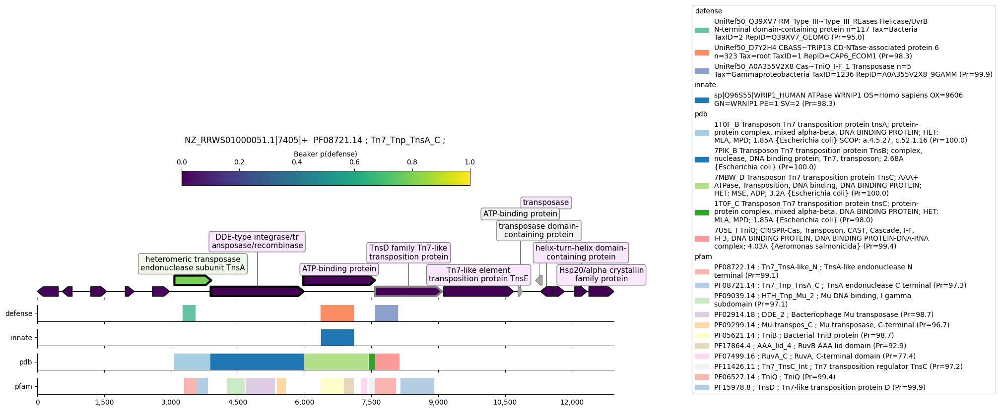

 87%|████████▋ | 61/70 [01:49<00:22,  2.53s/it]

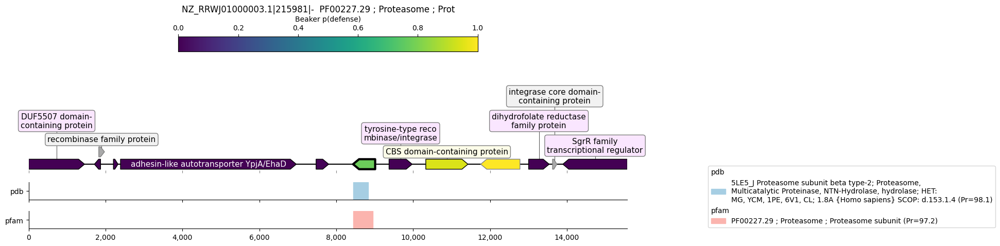

 89%|████████▊ | 62/70 [01:50<00:17,  2.14s/it]

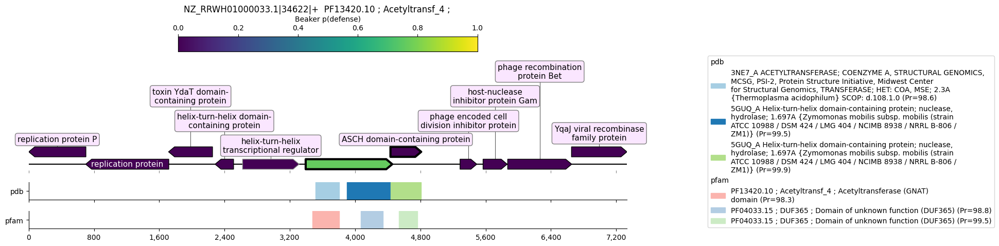

 90%|█████████ | 63/70 [01:52<00:13,  1.98s/it]

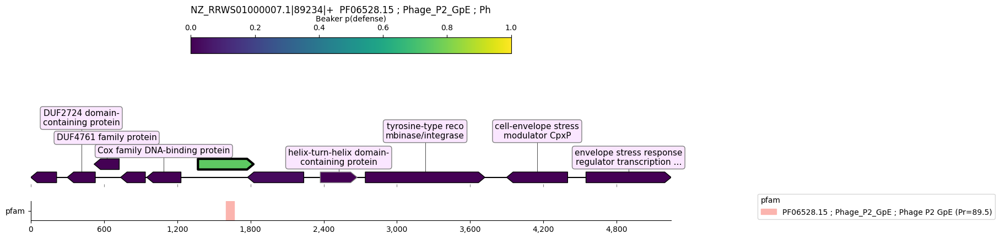

 91%|█████████▏| 64/70 [01:53<00:10,  1.73s/it]

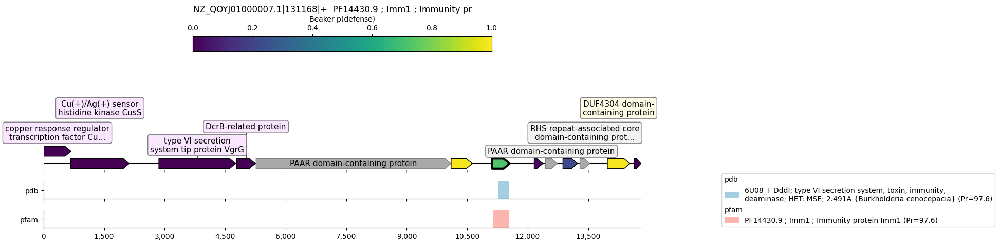

 93%|█████████▎| 65/70 [01:54<00:08,  1.64s/it]

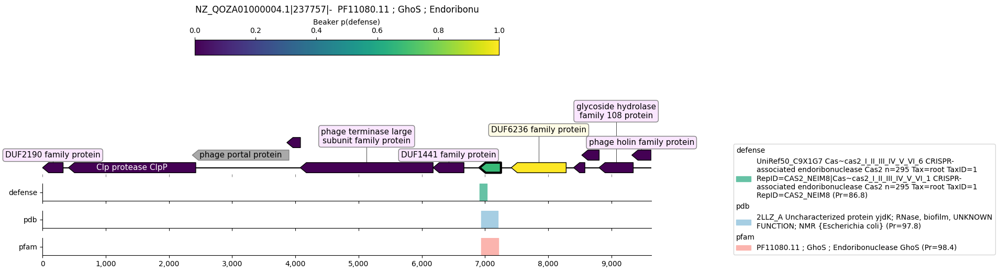

 94%|█████████▍| 66/70 [01:56<00:06,  1.61s/it]

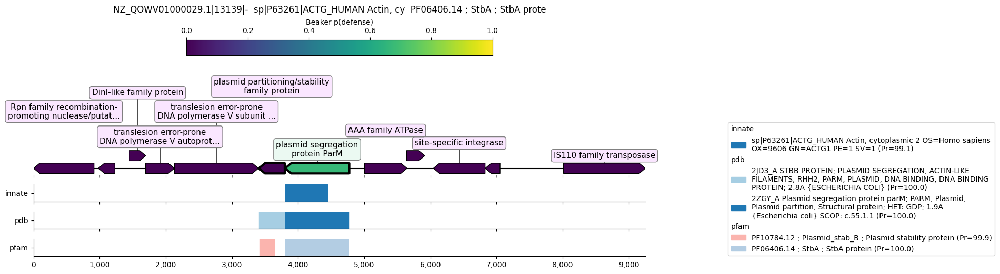

 96%|█████████▌| 67/70 [01:58<00:04,  1.64s/it]

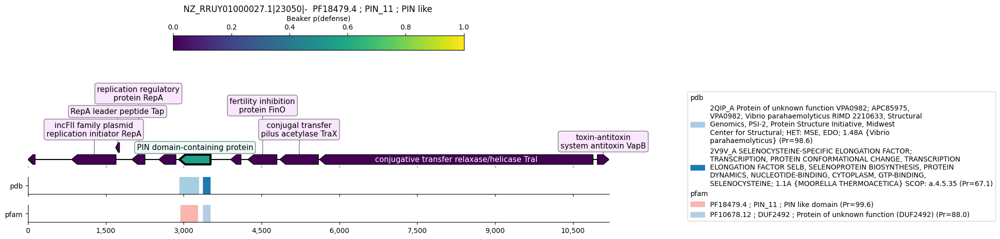

 97%|█████████▋| 68/70 [01:59<00:03,  1.62s/it]

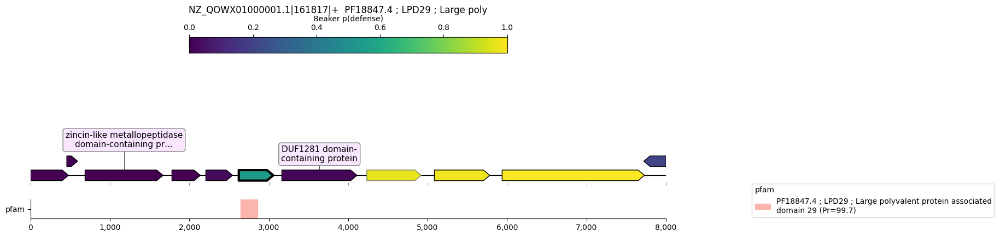

 99%|█████████▊| 69/70 [02:00<00:01,  1.46s/it]

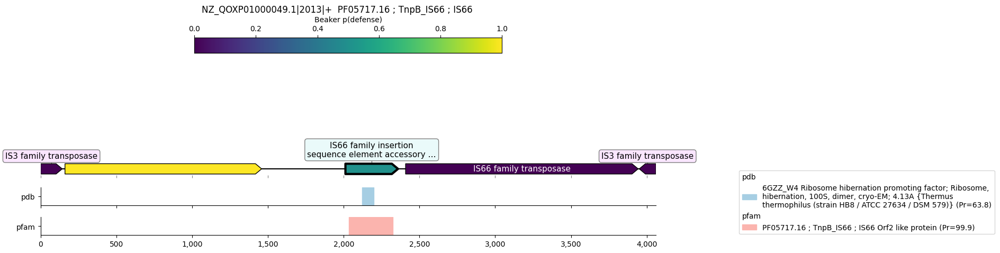

100%|██████████| 70/70 [02:02<00:00,  1.74s/it]


In [32]:
neighbors = 5
neighbor_list = []
for operon in tqdm(subsampled_operons):
    # genomic context 
    genomic_locus = re.split('\|', operon)[0]
    operon_df = sorted_predictions[sorted_predictions['operon'] == operon]
    operon_indeces = operon_df.index
    operon_max_index = max(operon_indeces)
    operon_min_index = min(operon_indeces)
    neighborhood_df = sorted_predictions.iloc[max(operon_min_index - neighbors, 0):
                                              min(operon_max_index + neighbors +1, len(sorted_predictions))]
    neighborhood_df = neighborhood_df[neighborhood_df['genomic_accession'] == genomic_locus]
    neighborhood_df['center_operon'] = neighborhood_df['operon'] == operon
    full_neighborhood_df = feature_df[(feature_df['genomic_accession'] == genomic_locus)]
    full_neighborhood_df = full_neighborhood_df[(full_neighborhood_df['start'] >= neighborhood_df['start'].min()) & 
                                                (full_neighborhood_df['end'] <= neighborhood_df['end'].max())]
    full_neighborhood_df = full_neighborhood_df[full_neighborhood_df['# feature'] != 'gene']
    full_neighborhood_df = (full_neighborhood_df
                            .merge(neighborhood_df[['genomic_accession', 'start', 'product_accession', 'strand', 
                                                    'beaker_prediction', 'defense_homolog', 
                                                    'center_operon', 'operon']], 
                                   how='left', on=['genomic_accession', 'start', 'product_accession', 'strand']))
    neighbor_list.append(full_neighborhood_df)
    domain_tuples = list()
    for category, category_df in top_alignment_dict.items():
        operon_domain_df = operon_df.merge(category_df, how='inner', on='query')
        if len(operon_domain_df):
            category_palette = domain_palette_mapping[category]
            domain_tuples.append((operon_domain_df, category, category_palette))
    operon_tm_df = (operon_df.merge(tm_out_df, how='inner', on='product_accession', 
                                    suffixes=('', '_tm')))
    if len(operon_tm_df):
        domain_tuples.append((operon_tm_df, 'tm', None))
    n_tracks = len(domain_tuples)
    if n_tracks:
        fig, axs = plt.subplots(n_tracks + 1, figsize=(15, 4 + 0.5*n_tracks), 
                                gridspec_kw={'height_ratios': [4] + [0.5]*n_tracks}, 
                                sharex=True)
        ax0 = axs[0]
        plot_neighborhood(full_neighborhood_df, ax=ax0)
        min_loc = full_neighborhood_df['start'].min()
        all_handles = []
        all_labels = []
        for (ax, (df, name, palette)) in zip(axs[1:], domain_tuples):
            handles, labels = plot_domains(df, min_loc, ax, 
                                       name, 'display_start', 'display_end', 'display_name',
                                       palette=palette)
            all_handles.extend(handles)
            all_labels.extend(labels)
        fig.legend(all_handles, all_labels, loc='lower left', bbox_to_anchor=(1, 0.1), 
                   handler_map={str: LegendTitle({'fontsize': 10})})
    else:
        fig, ax0 = plt.subplots(1, 1, figsize=(15, 4))
        plot_neighborhood(full_neighborhood_df, ax=ax0)
    operon_novel_domains = filtered_top_alignment_df[filtered_top_alignment_df['query']
                                                 .isin(operon_df['query'])]
    fig.suptitle(' '.join([operon] + operon_novel_domains['Hit'].to_list()))
    plt.savefig('../figures/novel_domain_operons/' + operon + '.svg', dpi=300, bbox_inches='tight')
    plt.show()
    

In [29]:
subsampled_operons

['NZ_QOWT01000046.1|6922|+',
 'NZ_QOXN01000005.1|236284|+',
 'NZ_RRWS01000007.1|89234|+']

In [82]:
sampled_operons.sort()
for operon in sampled_operons:
    print(operon)
    input('Waiting for enter')

NZ_QOWQ01000062.1|1591|-


Waiting for enter 


NZ_QOWS01000002.1|1381|-


Waiting for enter 


NZ_QOWV01000029.1|13139|-


Waiting for enter 


NZ_QOWW01000028.1|33011|+


Waiting for enter 


NZ_QOWW01000075.1|3912|-


Waiting for enter 


NZ_QOWX01000001.1|161817|+


Waiting for enter 


NZ_QOWX01000001.1|165133|+


Waiting for enter 


NZ_QOWZ01000056.1|6224|-


Waiting for enter 


NZ_QOXB01000036.1|34851|+


Waiting for enter 


NZ_QOXC01000026.1|1426|+


Waiting for enter 


NZ_QOXE01000044.1|12851|+


Waiting for enter 


NZ_QOXF01000045.1|29822|-


Waiting for enter 


NZ_QOXL01000002.1|320533|+


Waiting for enter 


NZ_QOXL01000006.1|205818|-


Waiting for enter 


NZ_QOXN01000017.1|78349|+


Waiting for enter 


NZ_QOXP01000049.1|2013|+


Waiting for enter 


NZ_QOXQ01000027.1|48629|+


Waiting for enter 


NZ_QOXQ01000048.1|13630|-


Waiting for enter 


NZ_QOXS01000004.1|38748|+


Waiting for enter 


NZ_QOYA01000013.1|1403|-


Waiting for enter 


NZ_QOYB01000006.1|22436|+


Waiting for enter 


NZ_QOYB01000018.1|26141|+


Waiting for enter 


NZ_QOYB01000018.1|32107|+


Waiting for enter 


NZ_QOYD01000005.1|49371|-


Waiting for enter 


NZ_QOYD01000046.1|2788|-


Waiting for enter 


NZ_QOYD01000049.1|12406|+


Waiting for enter 


NZ_QOYG01000008.1|68231|+


Waiting for enter 


NZ_QOYG01000008.1|78273|-


Waiting for enter 


NZ_QOYJ01000007.1|131168|+


Waiting for enter 


NZ_QOYJ01000028.1|43988|+


Waiting for enter 


NZ_QOYQ01000009.1|3899|-


Waiting for enter 


NZ_QOYQ01000037.1|30773|-


Waiting for enter 


NZ_QOYR01000012.1|38773|+


Waiting for enter 


NZ_QOYR01000032.1|1906|+


Waiting for enter 


NZ_QOYR01000034.1|8089|-


Waiting for enter 


NZ_QOYW01000006.1|142318|+


Waiting for enter 


NZ_QOYX01000005.1|61003|+


Waiting for enter 


NZ_QOYX01000011.1|43241|+


Waiting for enter 


NZ_QOZA01000004.1|237757|-


Waiting for enter 


NZ_QOZC01000044.1|3043|-


Waiting for enter 


NZ_QOZE01000008.1|94111|+


Waiting for enter 


NZ_RRUL01000002.1|403578|-


Waiting for enter 


NZ_RRUL01000016.1|55751|-


Waiting for enter 


NZ_RRUY01000027.1|23050|-


Waiting for enter 


NZ_RRVF01000023.1|5250|+


Waiting for enter 


NZ_RRVG01000003.1|54772|+


Waiting for enter 


NZ_RRVG01000080.1|2128|+


Waiting for enter 


NZ_RRVP01000009.1|103396|+


Waiting for enter 


NZ_RRVP01000015.1|72860|-


Waiting for enter 


NZ_RRVV01000001.1|90081|-


Waiting for enter 


NZ_RRVY01000002.1|220602|+


Waiting for enter 


NZ_RRVY01000003.1|365785|+


Waiting for enter 


NZ_RRWH01000008.1|1444|+


Waiting for enter 


NZ_RRWH01000033.1|34622|+


Waiting for enter 


NZ_RRWJ01000003.1|215981|-


Waiting for enter 


NZ_RRWL01000009.1|5979|-


Waiting for enter 


NZ_RRWL01000031.1|31849|-


Waiting for enter 


NZ_RRWS01000004.1|83803|-


Waiting for enter 


NZ_RRWS01000009.1|12522|+


Waiting for enter 


NZ_RRWS01000051.1|7405|+


Waiting for enter 


NZ_RRWT01000054.1|2063|-


Waiting for enter 


In [38]:
selected_operons = ['NZ_QOWQ01000062.1|1591|-', 
                    'NZ_QOWW01000028.1|33011|+', 
                    'NZ_QOWX01000001.1|165133|+',
                    'NZ_QOWZ01000056.1|6224|-',
                    'NZ_QOXC01000026.1|1426|+', 
                    'NZ_QOXE01000044.1|12851|+', 
                    'NZ_QOXN01000017.1|78349|+', 
                    'NZ_QOXQ01000027.1|48629|+', 
                    'NZ_QOXS01000004.1|38748|+', 
                    'NZ_QOYB01000018.1|32107|+', 
                    'NZ_QOYD01000049.1|12406|+', 
                    'NZ_QOYG01000008.1|68231|+',
                    'NZ_QOYQ01000009.1|3899|-', 
                    'NZ_QOYX01000005.1|61003|+', 
                    'NZ_QOZA01000004.1|237757|-', 
                    'NZ_QOZC01000044.1|3043|-',
                    'NZ_RRVG01000003.1|54772|+', 
                    'NZ_RRVY01000002.1|220602|+', 
                    'NZ_RRVY01000003.1|365785|+', 
                    'NZ_RRWH01000008.1|1444|+', 
                    'NZ_RRWH01000033.1|34622|+', 
                    'NZ_RRWL01000009.1|5979|-', 
                    'NZ_RRWS01000004.1|83803|-', 
                    'NZ_RRWS01000009.1|12522|+', 
                    'NZ_RRWT01000054.1|2063|-', 
                    'NZ_QOYF01000007.1|310084|+',
                    'NZ_RRVV01000058.1|3422|+', 
                    'NZ_QOWS01000021.1|47243|+']

In [39]:
selected_operon_df = (sampled_operon_df[sampled_operon_df['operon'].isin(selected_operons)])

In [40]:
operon_summary_df = (selected_operon_df.groupby(['operon', 'cloned', 'genomic_accession'])
                     .agg(min_prediction=('beaker_prediction', 'min'), 
                          max_prediction=('beaker_prediction', 'max'), 
                          n_proteins=('product_accession', 'count'), 
                          product_accessions=('product_accession', lambda x: ','.join(x)), 
                          total_protein_len=('product_length', 'sum'), 
                          defense_homologs=('defense_homolog', 'sum'))
                     .reset_index())

In [41]:
operon_summary_df[['operon', 'cloned']].drop_duplicates()['cloned'].value_counts()

cloned
False    23
True      5
Name: count, dtype: int64

TODO: add which domains are novel

In [42]:
operon_summary_df.to_csv('../data/interim/ecor_novel_domain_library.csv', index=False)